# COMPUTATIONAL COSMOLOGY
---
This project has been developed for the course Cosmology within the Master’s Degree in Physics at the University of Valencia. Its objective is to demonstrate the use of standard scientific libraries together with specialized astrophysical libraries in computational cosmology. The project applies numerical and data analysis techniques commonly used in modern cosmological research. It illustrates how these tools can be integrated to model cosmological scenarios and analyze data.

### Authors
- Alejandro Estellés Roig (aesroig@alumni.uv.es)
- Juan Ramón Díaz Santos (diazjuan@alumni.uv.es)


# Gravitational Lens
---
- This notebook is devoted to the numerical study of gravitational lensing as predicted by General Relativity.

- It focuses on the simulation of light deflection using ray-shooting techniques, allowing us to reconstruct lensed images and magnification patterns produced by puntual mass distributions. 

- Also microlensing effects generated by compact objects are explored. 

- Special attention is given to the computation of magnification maps and their dependence on lens parameters and source position. 


## 0. Libraries and System Configuration

### 0.1. Librerías
---

In [1]:
####################################

import os
import time
from datetime import datetime
import requests
from PIL import Image
import io

import matplotlib.pyplot as plt
import matplotlib.animation as animation
import matplotlib.patches as patches

from IPython.display import HTML
from IPython.display import Image

import numpy as np
from math import pi
    
import astropy.units as u
from astropy.io import fits

from scipy.signal import find_peaks
from scipy.ndimage import map_coordinates

import torch
import torch.nn.functional as F



## 1. Download of Astronomical Images
---
Several download options are available from public repositories:

**1. HiPS2FITS Service**

- Cropping of astronomical sky maps
- HiPS catalogs (DSS, SDSS, PanSTARRS, etc.)
- Allows the generation of FITS cutouts of arbitrary size from full-sky surveys
- https://alasky.cds.unistra.fr/hips-image-services/hips2fits

**2. SDSS Service:**

- JPEG cutouts via the SDSS SkyServer API
- Color images
- Coverage limited to a stripe in the Northern hemisphere:
$$7^h<RA<17^h \quad(105^\circ<RA<255^\circ),\quad\qquad -10^\circ<Dec<+70^\circ$$
- https://skyserver.sdss.org/dr16/en/tools/getimg/getimghome.aspx

### 1.1. Paramters and Astronomical Obects
---

In [2]:
DOWNLOAD_SERVICE = 'HIPS'
CATALOG          = 'DSS2'

RA, DEC          = 168.6958, 55.0189   # Coordinates in degrees
FOV              = 0.05                # Field of view in degrees
PIX_X, PIX_Y     = 1024, 1024          # Image resolution in pixels (width, height)
PROJECTION       = 'TAN'               # Gnomonic (tangent plane) projection

# Dictionary of bright stars and their J2000 coordinates in degrees
# RA is expressed in degrees (0 to 360), Dec in degrees (-90 to +90)

stars = {
    "Sirius":       {"RA": 101.2870833, "Dec": -16.7161111},   # α CMa
    "Canopus":      {"RA": 95.9879167,  "Dec": -52.6955556},   # α Car
    "Arcturus":     {"RA": 213.9154167, "Dec": +19.1825},     # α Boo
    "Alpha Centauri": {"RA": 219.9020833, "Dec": -60.8338889},# α Cen
    "Vega":         {"RA": 279.2345833, "Dec": +38.7836111},  # α Lyr
    "Capella":      {"RA": 79.1725,     "Dec": +45.9977778},  # α Aur
    "Rigel":        {"RA": 78.63375,    "Dec": -8.2016667},   # β Ori
    "Procyon":      {"RA": 114.8254167, "Dec": +5.225},      # α CMi
    "Achernar":     {"RA": 24.4283333,  "Dec": -57.2366667}, # α Eri
    "Betelgeuse":   {"RA": 88.7929167,  "Dec": +7.4069444},  # α Ori
    "Altair":       {"RA": 297.6958333, "Dec": +8.8666667},  # α Aql
    "Aldebaran":    {"RA": 68.9804167,  "Dec": +16.5088889}, # α Tau
    "Antares":      {"RA": 247.351875,  "Dec": -26.4327778}, # α Sco
    "Spica":        {"RA": 201.2983333, "Dec": -11.1613889}, # α Vir
    "Pollux":       {"RA": 116.3289167, "Dec": +28.0261111}, # β Gem
    "Deneb":        {"RA": 310.3579167, "Dec": +45.2802778}, # α Cyg
    "Polaris":      {"RA": 37.9545417,  "Dec": +89.2641111}  # North Star
}

# Dictionary of bright and well-known galaxies with J2000 coordinates in degrees

galaxies = {
    "Andromeda (M31)":    {"RA": 10.6847083,  "Dec": +41.26875,   "z": -0.001},   # local motion toward us
    "Triangulum (M33)":   {"RA": 23.4620833,  "Dec": +30.6597222, "z": 0.0006},
    "Sombrero (M104)":    {"RA": 189.9970833, "Dec": -11.6230556, "z": 0.0034},
    "Whirlpool (M51)":    {"RA": 202.4695833, "Dec": +47.1952778, "z": 0.0015},
    "Pinwheel (M101)":    {"RA": 210.8020833, "Dec": +54.3488889, "z": 0.0008},
    "Messier 87 (M87)":   {"RA": 187.7059167, "Dec": +12.3911111, "z": 0.0043},
    "Messier 81 (M81)":   {"RA": 148.8882083, "Dec": +69.0652778, "z": -0.0001},  # very local
    "Messier 82 (M82)":   {"RA": 148.9684583, "Dec": +69.6797222, "z": 0.0007},
    "Centaurus A (NGC 5128)": {"RA": 201.3650625, "Dec": -43.019112, "z": 0.0018},
    "Large Magellanic Cloud (LMC)": {"RA": 80.8941667, "Dec": -69.7561111, "z": 0.00093},
    "Small Magellanic Cloud (SMC)": {"RA": 13.1583333, "Dec": -72.800278, "z": 0.00053},
    "NGC 4889 (Coma Cluster)": {"RA": 195.0333, "Dec": +27.9775, "z": 0.021},
    "NGC 4874 (Coma Cluster)": {"RA": 194.8988, "Dec": +27.9594, "z": 0.022},
    "3C 273 (Quasar)":         {"RA": 187.2779, "Dec": +2.0524,  "z": 0.158},
    "NGC 1275 (Perseus A)":    {"RA": 49.9507,  "Dec": +41.5117, "z": 0.0176},
    "MACS J1149.5+2223":       {"RA": 177.3988, "Dec": +22.3980, "z": 0.544},
    "Abell 1689":              {"RA": 197.8733, "Dec": -1.3400,  "z": 0.183},
    "El Gordo (ACT-CL J0102-4915)": {"RA": 15.7270, "Dec": -49.2478, "z": 0.87},
    "GN-z11 (most distant known galaxy ~2023)": {"RA": 189.2292, "Dec": +62.2700, "z": 11.09}
}

# Select target object and category (stars or galaxies)
OBJECT = 'NGC 4889 (Coma Cluster)'
CATEGORY = galaxies
COORD = CATEGORY[OBJECT]   # Extract RA, Dec (and z if available) for the selected object



### 1.2. HiPS2FITS Service (https://irsa.ipac.caltech.edu/)

In [3]:
def fetch_hips2fits_cutout(catalogo: str,
                          coord,
                          fov: float,
                          width: int, height: int,
                          projection: str = "TAN",
                          debug = True):
    """
    Request a FITS cutout from the CDS / Alasky hips2fits service.
    Returns a NumPy array with the image data if the request is successful.
    """
    base_url = "http://alasky.cds.unistra.fr/hips-image-services/hips2fits"
    
    # Request parameters
    params = {
        "hips": catalogo,
        "ra": coord['RA'],
        "dec": coord['Dec'],
        "fov": fov,
        "width": width,
        "height": height,
        "projection": projection
    }
    
    # Send HTTP request to the service
    resp = requests.get(base_url, params=params)
    resp.raise_for_status()
    
    # The response content should be a FITS file
    hdul = fits.open(io.BytesIO(resp.content))
    
    # Print FITS structure if debug mode is enabled
    if debug:
        print(hdul.info())
    
    data = None
    
    # Extract the first HDU that contains image data
    for hdu in hdul:
        if hdu.data is not None:
            data = hdu.data
            break
    
    # Convert to contiguous float32 array for numerical processing
    data = np.ascontiguousarray(data.astype(np.float32))
    
    return data

    

### 1.3. SDSS Service (http://skyserver.sdss.org/)

In [4]:
def fetch_sdss_cutout(coord,
                      fov: float,
                      width: int, height: int,
                      opt: str = ""):
    """
    Request a JPEG cutout image from the SDSS SkyServer service.
    Returns the image as a NumPy array.
    """
    # Base URL of the SDSS image cutout service
    base = "http://skyserver.sdss.org/dr16/SkyServerWS/ImgCutout/getjpeg"
    
    # Compute the image scale in arcseconds per pixel
    # (field of view in arcseconds divided by image width in pixels)
    scale = (FOV * 3600) / width
    
    # Parameters for the HTTP request
    params = {
        "ra": coord['RA'],     # Right Ascension in degrees
        "dec": coord['Dec'],   # Declination in degrees
        "scale": scale,        # Image scale (arcsec/pixel)
        "width": width,        # Image width in pixels
        "height": height,      # Image height in pixels
        "opt": opt             # Optional SDSS flags (e.g., grid, labels)
    }
    
    # Send the request to the SDSS service
    resp = requests.get(base, params=params)
    resp.raise_for_status()
    
    # Load the JPEG image from the response into a PIL Image object
    image = Image.open(io.BytesIO(resp.content))
    
    # Convert the PIL Image into a NumPy array for numerical processing
    return np.array(image)


### 1.4. Download of Astronomical Data
---

In [5]:
def get_Image_Astro(coord,
                    fov=FOV,
                    width=PIX_X,
                    height=PIX_Y,
                    fits_filename=None,   # NEW argument: output FITS file name
                    debug=False):
    """
    Download an astronomical image from the selected service and optionally
    save it to a FITS file.

    Parameters
    ----------
    coord : dict
        Dictionary with 'RA' and 'Dec' keys (in degrees).
    fov : float
        Field of view in degrees.
    width, height : int
        Image dimensions in pixels.
    fits_filename : str or None
        If provided, the image will be saved to this FITS file.
    debug : bool
        Enable debug output.

    Returns
    -------
    image : np.ndarray or None
        Downloaded image array, or None if the service fails.
    """
    if DOWNLOAD_SERVICE == 'HIPS':
        image = fetch_hips2fits_cutout(
            catalogo=CATALOG,
            coord=coord,
            fov=fov,
            width=width,
            height=height,
            projection=PROJECTION,
            debug=debug
        )

    elif DOWNLOAD_SERVICE == 'SDSS':
        image = fetch_sdss_cutout(
            coord=coord,
            fov=fov,
            width=width,
            height=height,
        )
    else:
        image = None

    # Save to FITS file if requested
    if image is not None and fits_filename is not None:
        hdu = fits.PrimaryHDU(image)
        hdul = fits.HDUList([hdu])
        hdul.writeto(fits_filename, overwrite=True)
        if debug:
            print(f"\n\t--> FITS file saved as: {fits_filename}")

    return image


# Example usage
image_astro = get_Image_Astro(coord=COORD,
                              fits_filename="astro_image.fits", 
                              debug=True
                             )

if image_astro is not None:
    print(f"\nData successfully downloaded from {DOWNLOAD_SERVICE}",
          f"\n\t--> OBJECT = {OBJECT}",  
          f"\n\t--> COORD  = {COORD}",
          f"\n\t--> SHAPE  = {image_astro.shape}")

Filename: <class '_io.BytesIO'>
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      24   (1024, 1024)   int16   
None

	--> FITS file saved as: astro_image.fits

Data successfully downloaded from HIPS 
	--> OBJECT = NGC 4889 (Coma Cluster) 
	--> COORD  = {'RA': 195.0333, 'Dec': 27.9775, 'z': 0.021} 
	--> SHAPE  = (1024, 1024)


### 1.5. Analysis and Data Visualization
---

Image dimensions: (1024, 1024)
Mean background level: 5884.79 ADU
Median background level: 5362.00 ADU
Noise level (standard deviation): 1954.55 ADU
Field of View (FOV): 0.05 degrees = 180.00 arcsec
Brightest object at pixel: (493, 494), value=24144.0


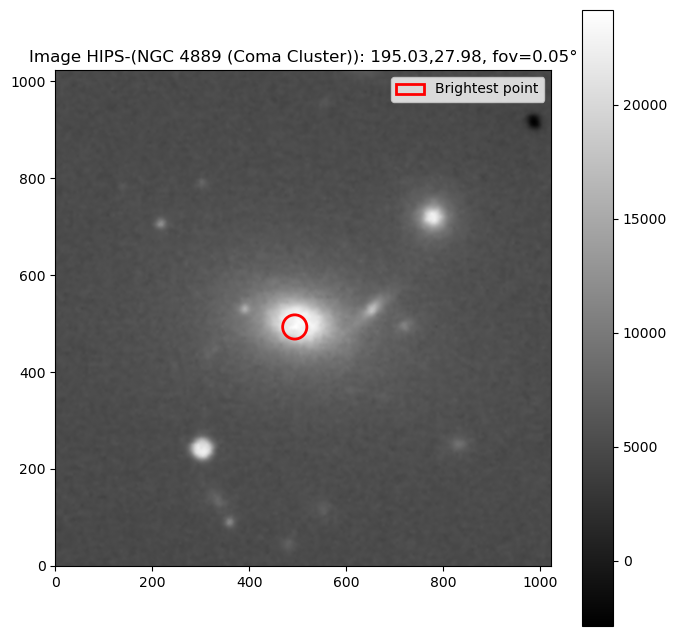

In [6]:
# Basic image statistics
mean_val = np.mean(image_astro)
median_val = np.median(image_astro)
std_val = np.std(image_astro)

# Print statistical properties of the image
print(f"Image dimensions: {image_astro.shape}")
print(f"Mean background level: {mean_val:.2f} ADU")
print(f"Median background level: {median_val:.2f} ADU")
print(f"Noise level (standard deviation): {std_val:.2f} ADU")
print(f"Field of View (FOV): {FOV} degrees = {FOV*3600:.2f} arcsec")

# Locate the brightest pixel (candidate bright star or galaxy)
brightest = np.unravel_index(np.argmax(image_astro), image_astro.shape)
print(f"Brightest object at pixel: {brightest}, value={image_astro[brightest]:.1f}")

# Image visualization    
if image_astro is not None:
    fig, ax = plt.subplots(figsize=(8, 8))
    
    # Display the astronomical image
    im = ax.imshow(image_astro, origin='lower', cmap='gray')
    plt.colorbar(im, ax=ax)
    
    # Set plot title with object name and sky coordinates
    ax.set_title(f"Image {DOWNLOAD_SERVICE}-({OBJECT}): {COORD['RA']:.2f},{COORD['Dec']:.2f}, fov={FOV:.2f}°")
    
    # Recompute the brightest pixel position
    brightest = np.unravel_index(np.argmax(image_astro), image_astro.shape)
    
    # Draw a circle around the brightest pixel
    circ = plt.Circle((brightest[1], brightest[0]), radius=25, 
                      edgecolor='red', facecolor='none', lw=2, label="Brightest point")
    ax.add_patch(circ)
    
    # Optional: annotate the brightest region with text
    # ax.text(brightest[1]+12, brightest[0], "Brightest", color="red", fontsize=10)

    plt.legend(loc="upper right")
    plt.show()
else:
    print("The image could not be downloaded from the service:", DOWNLOAD_SERVICE)




## 2. Simulation Parameters and Auxliary Functions
---

### 2.1. Auxiliary Functions
---

In [7]:
# -------------------------
# Funciones cosmológicas simples (aprox. plano FRW)
# -------------------------
from scipy.integrate import quad

def E_inv(z):
    """1/E(z) para integral comóvil"""
    return 1.0/np.sqrt(Omega_m*(1+z)**3 + Omega_L)

def comoving_distance(z):
    """Distancia comóvil en Mpc"""
    integral, _ = quad(E_inv, 0, z)
    return (c/H0) * integral  # Mpc

def angular_diameter_distance(z1, z2=None):
    """
    Distancia angular [Mpc].
    Si solo z1: desde 0 hasta z1.
    Si z1<z2: entre z1 y z2.
    """
    if z2 is None:
        Dc = comoving_distance(z1)
        return Dc/(1+z1)
    else:
        Dc1 = comoving_distance(z1)
        Dc2 = comoving_distance(z2)
        return (Dc2 - Dc1)/(1+z2)

# -------------------------
# Radio de Einstein (masa puntual)
# -------------------------
def theta_E_point_mass(M_Msun, Dd, Ds, Dds):
    """Radio de Einstein [radianes] para lente puntual"""
    M = M_Msun * M_sun
    numerator = 4*G_SI*M/(c*1000)**2 * (Dds* Mpc)
    denominator = (Dd* Mpc) * (Ds* Mpc)
    return np.sqrt(numerator/denominator)

# -------------------------
# Radio de Einstein (SIS)
# -------------------------
def theta_E_SIS(sigma_v, Ds, Dds):
    """Radio de Einstein [radianes] para SIS"""
    return 4*np.pi*(sigma_v/c)**2 * (Dds/Ds)


### 2.2. Simulation Parameters
---
**Cosmological Parameters:**

- Hubble constant $ H_0 $ (e.g., 67 km/s/Mpc): Affects distances $ D $.

- Densities $ \Omega_m, \Omega_\Lambda, \Omega_k $: Determine the geometry (flat if $ \Omega_k = 0 $) and the expansion rate $ H(z) $.

- Redshifts $ z_L $ (lens) and $ z_S $ (source): Used to compute angular diameter distances $ D_L, D_S, D_{LS} $.

**Lens Parameters:**

- Total mass, M

- Density profile, $\rho$. Used in the case of a distributed mass (SIS). A typical example is the singular isothermal sphere, $ \rho \propto r^{-2} $.

**Source Parameters:**

- Angular position $ \vec{\beta} $, intrinsic brightness, and morphology (e.g., disk, point source for a quasar).

- Emission spectrum (for chromatic lensing, if dispersion is simulated).

**Numerical Simulation Parameters:**

- Spatial resolution (e.g., grid size for ray tracing, 1024x1024 pixels).

- Number of rays or iterations (for convergence in non-linear solvers).

- Instrumental noise and angular resolution (e.g., telescope beam such as HST or JWST).

In [8]:
#-------------------------
# Cosmological parameters
# -------------------------
H0 = 70.0      # Hubble constant [km/s/Mpc]
c_km = 3.0e5   # speed of light [km/s] (approximate)
c = 2.99792458e5  # speed of light [km/s] (more precise)

Omega_m = 0.5     # matter density parameter
Omega_L = 1.0     # dark energy density parameter

# -------------------------
# Redshifts
# -------------------------
z_d = 0.01   # lens redshift
z_s = 1.5    # source redshift

# -------------------------
# Angular diameter distances
# -------------------------
Dd = angular_diameter_distance(z_d)        # observer–lens distance
Ds = angular_diameter_distance(z_s)        # observer–source distance
Dds = angular_diameter_distance(z_d, z_s)  # lens–source distance

# -------------------------
# Lens parameters (point mass or SIS example)
# -------------------------
M_lens = 1.0e12   # lens mass [M_sun]
sigma_v = 220.0   # velocity dispersion [km/s] (for SIS model)

# -------------------------
# Unit conversions
# -------------------------
M_sun = 1.98847e30  # solar mass [kg]
G_SI = 6.67430e-11  # gravitational constant [m^3/kg/s^2]

pc = 3.0856775814913673e16  # parsec in meters
Mpc = 1.0e6 * pc            # megaparsec in meters
rad2arcsec = 206265.0       # 1 rad = 206265 arcsec = (180/π) * 3600

# Compute Einstein radius for point-mass lens
theta_E_rad = theta_E_point_mass(M_lens, Dd, Ds, Dds)
theta_E_arcsec = theta_E_rad * rad2arcsec

# Compute Einstein radius for SIS lens
theta_E_sis_rad = theta_E_SIS(sigma_v, Ds, Dds)
theta_E_sis_arcsec = theta_E_sis_rad * rad2arcsec

# -------------------------
# Output of cosmological parameters
# -------------------------
print(">> Cosmology\n", '*'*30)
print(f"H0       = {H0:.1f} km/s/Mpc")
print(f"c        = {c:.3e} km/s")
print(f"Ω_m      = {Omega_m}")
print(f"Ω_Λ      = {Omega_L}\n")

# -------------------------
# Output of redshifts
# -------------------------
print(">> Redshifts\n", '*'*30)
print(f"z_d (lens)    = {z_d}")
print(f"z_s (source)  = {z_s}\n")

# -------------------------
# Output of lens parameters
# -------------------------
print(">> Gravitational lens\n", '*'*30)
print(f"M_lens  = {M_lens:.2e} M_sun")
print(f"sigma_v = {sigma_v:.1f} km/s\n")

# -------------------------
# Output of angular distances
# -------------------------
print(">> Angular diameter distances\n", '*'*30)
print(f"Dd  = {Dd:.2f} Mpc")
print(f"Ds  = {Ds:.2f} Mpc")
print(f"Dds = {Dds:.2f} Mpc")

# -------------------------
# Output of Einstein radius
# -------------------------
print("\n>> Einstein radius\n", '*'*30)
print(f"Einstein radius (point mass): {theta_E_arcsec:.3f} arcsec ({theta_E_rad:.6f} radians)")
print(f"Einstein radius (SIS): {theta_E_sis_arcsec:.3f} arcsec")
print(f'FOV: {FOV}° = {FOV*3600} arcsec = {FOV*np.pi/180.0} radians')


>> Cosmology
 ******************************
H0       = 70.0 km/s/Mpc
c        = 2.998e+05 km/s
Ω_m      = 0.5
Ω_Λ      = 1.0

>> Redshifts
 ******************************
z_d (lens)    = 0.01
z_s (source)  = 1.5

>> Gravitational lens
 ******************************
M_lens  = 1.00e+12 M_sun
sigma_v = 220.0 km/s

>> Angular diameter distances
 ******************************
Dd  = 34.54 Mpc
Ds  = 1391.10 Mpc
Dds = 1377.15 Mpc

>> Einstein radius
 ******************************
Einstein radius (point mass): 15.279 arcsec (0.000074 radians)
Einstein radius (SIS): 1.382 arcsec
FOV: 0.05° = 180.0 arcsec = 0.0008726646259971648 radians


## 3. Point Gravitational Lenses
---

* **Deflection Angle** $ \vec{\alpha} $: For a point lens (mass M), the deflection angle is:
  $$\hat{\alpha} = \frac{4GM}{c^2 b}$$
  where $ G $ is the gravitational constant, $ c $ is the speed of light, and $ b $ is the impact parameter (minimum distance between the light trajectory and the lens).

* **Lens Equation**: It relates the true position of the source $ \vec{\beta} $ to the observed position of the image $ \vec{\theta} $:
  $$\vec{\beta} = \vec{\theta} - \vec{\alpha}(\vec{\theta})$$
  This is a nonlinear equation that is solved numerically in simulations to find multiple images. In dimensionless form, the lensing potential $ \psi(\vec{\theta}) $ is used:
  $$\psi(\vec{\theta}) = \frac{1}{\pi} \int \kappa(\vec{\theta}') \ln|\vec{\theta} - \vec{\theta}'| d^2\theta'$$
  where $ \kappa = \Sigma / \Sigma_{cr} $ is the convergence, and $ \Sigma_{cr} = \frac{c^2}{4\pi G} \frac{D_S}{D_L D_{LS}} $ is the critical surface density, with $ D_L, D_S, D_{LS} $ the angular diameter distances to the lens, to the source, and between them.

* **Einstein Radius** $ \theta_E $: Characteristic angular scale for strong lensing:
  $$\theta_E = \sqrt{\frac{4GM}{c^2} \frac{D_{LS}}{D_L D_S}}$$
  For M ≈ 10^{12} M_⊙ (a typical galaxy), $ \theta_E $ ≈ 1–10 arcseconds.

In simulations, ray tracing is solved numerically through a 3D potential (e.g., using N-body simulations for dark matter halos) or through a projected 2D potential, incorporating cosmological effects such as redshift and curvature.


### 3.1. Angular Grid of the Lens Plane
---

**Lens Geometry**

* **Image plane or Observed plane** (lens plane, coordinates $\theta$). It is the angular plane in which the observer measures the apparent position of the deflected light rays. Here we define the grid
  $$(x,y) \equiv (\theta_x, \theta_y)$$
  which are (apparent) angles on the sky.

**Code**

* The field of view, FOV (Field of Vision), corresponding to the grid, taking into account the image resolution.
* Definition of the angular grid in the lens plane (coordinates $\theta$).



In [9]:
# -----------------------------
# Simulation resolution and equivalent field of view (FOV)
# -----------------------------
N = PIX_X                     # simulation resolution (number of pixels per axis)
fov_rad = FOV * np.pi / 180.0 # field of view in radians
dx = fov_rad / N              # angular pixel size [rad]
fov_arcsec = FOV * 3600       # field of view in arcseconds

# -----------------------------
# Definition of the field of view and angular grid (lens plane)
# -----------------------------
# Centered angular grid
x = (np.arange(N) - (N - 1) / 2.0) * dx
y = (np.arange(N) - (N - 1) / 2.0) * dx
yy, xx = np.meshgrid(y, x, indexing='ij')

# Print basic information about the simulation setup
print(f'Image resolution:          {PIX_X} pixels')
print(f'Field of View (FOV):       {fov_arcsec} arcsec = {fov_rad:.5f} radians')
print(f'Einstein radius:           {theta_E_arcsec:.2f} arcsec')

print(f'\nAngular pixel size:        {dx:.2e} radians/pixel')
print(f'Angular grid size:         {list(xx.shape)}')

# Print the angular range covered by the grid
print(f'\nGrid range (radians):\n\t\t X = [ {xx.min().item():.5f}, {yy.min().item():.5f}] '
      f'\n\t\t Y = [{xx.max().item():.5f}, {yy.max().item():.5f}]')


Image resolution:          1024 pixels
Field of View (FOV):       180.0 arcsec = 0.00087 radians
Einstein radius:           15.28 arcsec

Angular pixel size:        8.52e-07 radians/pixel
Angular grid size:         [1024, 1024]

Grid range (radians):
		 X = [ -0.00044, -0.00044] 
		 Y = [0.00044, 0.00044]


### 3.2. Deflection in the Lens Plane, $\hat{\alpha}$, and in the Image Plane $\alpha$
---

**Lens Geometry**

* **Lens plane.** The deflection produced by a point mass, computed directly from General Relativity, is:
  $$\vec{\hat{\mathbf{\alpha}}} (b) = \frac{4GM}{c^2}\frac{\vec{\mathbf{ b}}}{b}$$
  where $b=D_d|\theta|$ is the impact parameter in physical coordinates and $\vec{\mathbf b}$ is the unit vector in the direction of $b$.

* **Source plane.** When this deflection is transferred to the source plane, a geometric factor appears:
  $$\vec{\mathbf{\alpha}} (\theta)  = \frac{D_{ds}}{D_s},\vec{\hat{\mathbf{\alpha}}} (\theta)$$

If this is combined with the previous definition (substituting $\alpha(\theta)$ and using the relation $b=D_d|\theta|$), one obtains:
$$\vec{\mathbf{\alpha}} (\theta)  =\theta^2_E, \frac{\mathbf{\theta}}{|\theta|^2}$$

**Code**

* The deflection $\alpha$ due to a point mass is computed as a function of the coordinates $\vec\theta$ in the lens plane (using the Einstein radius, $\theta_E$) at each point of that lens plane.
* It is computed both in the lens plane, $\hat{\alpha}$, and in the source plane, ${\alpha}$.


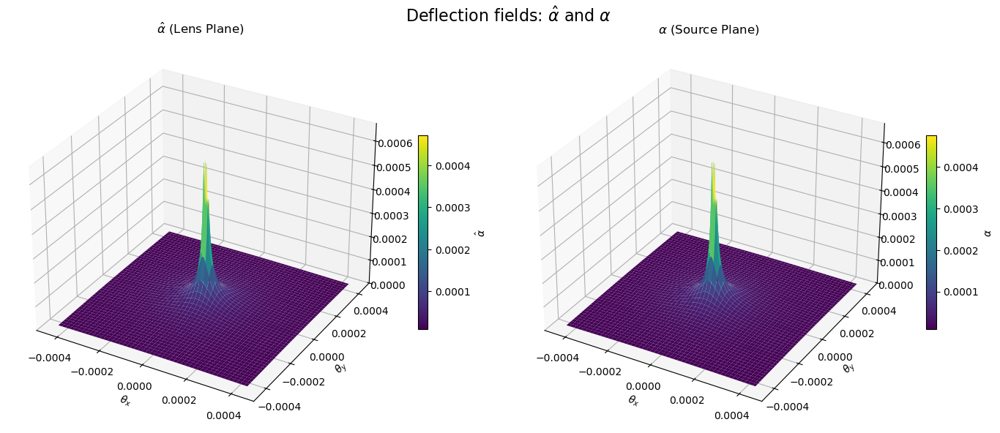

In [10]:
# -----------------------------
# Deflection (point-mass lens)
# -----------------------------
# Compute the radial angular distance r = |theta| at each grid point.
# A small epsilon is added to avoid division by zero at the lens center.
r = np.sqrt(xx**2 + yy**2) + 1e-12  # Impact-parameter-like quantity on the angular grid

# Deflection field in the source plane using the point-mass relation:
# alpha(theta) = theta_E^2 * theta / |theta|^2
alpha_x = theta_E_rad**2 * xx / r**2
alpha_y = theta_E_rad**2 * yy / r**2

# Clip extreme deflection values to keep them within the grid limits
# (prevents numerical blow-ups near the center from dominating the visualization)
mask_x = alpha_x > xx.max()
mask_y = alpha_y > yy.max()
alpha_x[mask_x] = xx.max()
alpha_y[mask_y] = yy.max()

mask_x = alpha_x < xx.min()
mask_y = alpha_y < yy.min()
alpha_x[mask_x] = xx.min()
alpha_y[mask_y] = yy.min()

# Convert between deflection in different planes via the geometric distance factor
# (depending on convention: lens plane vs source plane)
hat_alpha_x = alpha_x * Dds / Ds
hat_alpha_y = alpha_y * Dds / Ds

# Convenience aliases for plotting axes
X = xx
Y = yy

# Compute the magnitude of the deflection vectors
A = np.sqrt(alpha_x**2 + alpha_y**2)             # |alpha|
hat_A = np.sqrt(hat_alpha_x**2 + hat_alpha_y**2) # |hat_alpha|

# -----------------------------
# 3D visualization of alpha and hat_alpha
# -----------------------------
fig, axes = plt.subplots(1, 2, figsize=(14, 6), subplot_kw={'projection': '3d'})

# Plot |hat_alpha| (lens-plane deflection magnitude)
surf1 = axes[0].plot_surface(X, Y, hat_A, cmap='viridis', edgecolor='none')
axes[0].set_title(r"$\hat{\alpha}$ (Lens Plane)")
axes[0].set_xlabel(r"$\theta_x$")
axes[0].set_ylabel(r"$\theta_y$")
axes[0].set_zlim(0, hat_A.max() * 1.1)
fig.colorbar(surf1, ax=axes[0], shrink=0.5, aspect=20, label=r"$\hat{\alpha}$")

# Plot |alpha| (source-plane deflection magnitude)
surf2 = axes[1].plot_surface(X, Y, A, cmap='viridis', edgecolor='none')
axes[1].set_title(r"$\alpha$ (Source Plane)")
axes[1].set_xlabel(r"$\theta_x$")
axes[1].set_ylabel(r"$\theta_y$")
axes[1].set_zlim(0, A.max() * 1.1)
fig.colorbar(surf2, ax=axes[1], shrink=0.5, aspect=20, label=r"$\alpha$")

plt.suptitle(r"Deflection fields: $\hat{\alpha}$ and $\alpha$", fontsize=16)
plt.tight_layout()
plt.show()


### 3.3. Angular Grid in the Source Plane

---

**Lens Geometry**

* **Source Plane.** This is the angular plane where the source would be located in the absence of lensing. The coordinates, $ \beta $, describe the true angular position of the source and are therefore obtained by applying **the lens equation**:
  $$\vec{\beta}=\vec{\theta}-\vec{\alpha}(\vec\theta)$$
  where $\vec{\alpha}$ is the deflection angle in the source plane computed in the previous step.

**Code**:

* The values of $\beta$ are computed for each point of the lens plane. This value also corresponds to the true position in the source plane.
* The value in pixels is then computed (taking into account the angular resolution, $dx$) and the grid is shifted to the center of the source plane (in pixels):
  $$\mathbf{P} = \frac{\mathbf{\beta}}{dx} - \frac{N-1}{2}$$


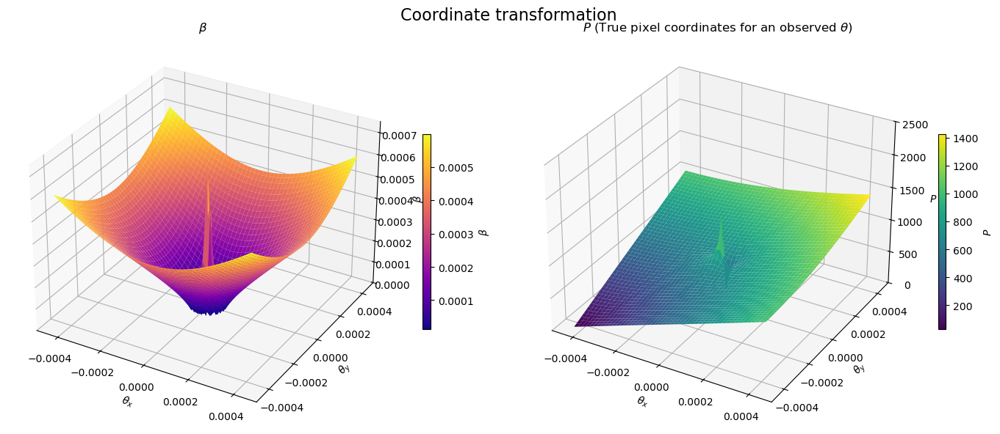

OBSERVATIONS:
 --------------------
 - The point mass is centered at the origin of both the lens and source planes, $\theta = [0,0]$
 - After the coordinate transformation, the pixel [0,0] corresponds to the lower-left corner of the source plane
 - The point mass (center of the source plane) is mapped to pixel $[(N-1)/2, (N-1)/2]$


In [11]:
# Lens equation: beta = theta - alpha
beta_x = xx - alpha_x
beta_y = yy - alpha_y

# Convert beta to pixel indices for grid sampling
# (mapping angular coordinates to pixel coordinates)
Px = beta_x / dx + (N - 1) / 2
Py = beta_y / dx + (N - 1) / 2

# Compute magnitudes
B = np.sqrt(beta_x**2 + beta_y**2)  # magnitude of beta (source-plane angular position)
P = np.sqrt(Px**2 + Py**2)          # magnitude of P (distance in pixels from the center)

# -----------------------------
# 3D visualization of P and beta
# -----------------------------
fig, axes = plt.subplots(1, 2, figsize=(14, 6), subplot_kw={'projection': '3d'})

# beta
surf1 = axes[0].plot_surface(X, Y, B, cmap='plasma', edgecolor='none')
axes[0].set_title(r"$\beta$")
axes[0].set_xlabel(r"$\theta_x$")
axes[0].set_ylabel(r"$\theta_y$")
axes[0].set_zlabel(r"$\beta$")
axes[0].set_zlim(0, 0.015 * FOV)
fig.colorbar(surf1, ax=axes[0], shrink=0.5, aspect=25, label=r"$\beta$")

# Pixels
surf2 = axes[1].plot_surface(X, Y, P, cmap='viridis', edgecolor='none')
axes[1].set_title(r"$P$ (True pixel coordinates for an observed $\theta$)")
axes[1].set_xlabel(r"$\theta_x$")
axes[1].set_ylabel(r"$\theta_y$")
axes[1].set_zlabel(r"$P$")
axes[1].set_zlim(0, 2500)
fig.colorbar(surf2, ax=axes[1], shrink=0.5, aspect=25, label=r"$P$")

plt.suptitle(r"Coordinate transformation", fontsize=16)
plt.tight_layout()
plt.show()

print('OBSERVATIONS:\n', '-' * 20)
print(r' - The point mass is centered at the origin of both the lens and source planes, $\theta = [0,0]$')
print(' - After the coordinate transformation, the pixel [0,0] corresponds to the lower-left corner of the source plane')
print(r" - The point mass (center of the source plane) is mapped to pixel $[(N-1)/2, (N-1)/2]$")



### 3.4. Ray Shooting de la imagen Fuente
---
Se realiza la transformación **punto a punto** del plano de la fuente utilizando la correspondencia con $\beta$ 

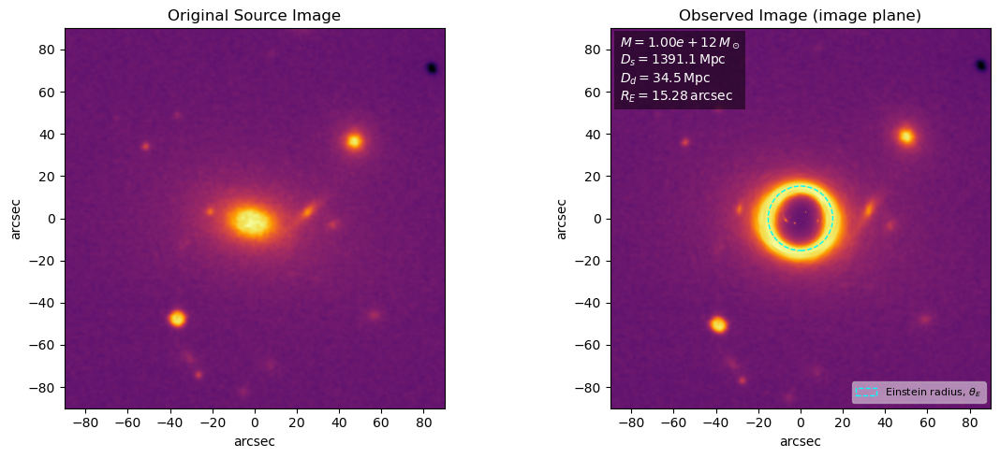

In [12]:
# -----------------------------
# Source image (NumPy, 2D)
# -----------------------------
# Sourceis a 2D float32 array of shape (N, N)
if image_astro is None:
    raise ValueError("image_astro is None. Download the image first.")

if image_astro.ndim == 3:
    src = image_astro[:, :, 0].astype(np.float32)
else:
    src = image_astro.astype(np.float32)

if src.shape != (N, N):
    # Simple center-crop or pad to (N, N)
    src_fixed = np.zeros((N, N), dtype=np.float32)
    h, w = src.shape[:2]
    h0 = max(0, (h - N) // 2)
    w0 = max(0, (w - N) // 2)
    src_crop = src[h0:h0 + N, w0:w0 + N]
    ch, cw = src_crop.shape
    src_fixed[:ch, :cw] = src_crop
    src = src_fixed

# -----------------------------
# Ray-shooting (NumPy bilinear interpolation)
# -----------------------------
# Ensure Px, Py are 2D float arrays (N, N)
Px = np.asarray(Px, dtype=np.float32)
Py = np.asarray(Py, dtype=np.float32)

if Px.shape != (N, N) or Py.shape != (N, N):
    raise ValueError(f"Px/Py must be (N,N)={(N,N)} but got Px={Px.shape}, Py={Py.shape}")

# Clip coordinates to valid pixel range 
Px_clip = np.clip(Px, 0, N - 1)
Py_clip = np.clip(Py, 0, N - 1)

# map_coordinates expects coords as (row, col) = (y, x)
coords = np.vstack([Py_clip.ravel(), Px_clip.ravel()])     # shape (2, N*N)
lensed = map_coordinates(src, coords, order=1, mode='constant', cval=0.0).reshape(N, N)

# -----------------------------
# Visualization (
# -----------------------------
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(
    src,                     # <-- src is 2D
    origin='lower',
    cmap='inferno',
    extent=[-fov_arcsec/2, fov_arcsec/2, -fov_arcsec/2, fov_arcsec/2]
)
plt.title("Original Source Image")
plt.xlabel("arcsec")
plt.ylabel("arcsec")

ax2 = plt.subplot(1, 2, 2)
textstr = '\n'.join((
    r"$M = %.2e\, M_\odot$" % M_lens,
    r"$D_s = %.1f\, \mathrm{Mpc}$" % Ds,
    r"$D_d = %.1f\, \mathrm{Mpc}$" % Dd,
    r"$R_E = %.2f\, \mathrm{arcsec}$" % theta_E_arcsec
))

im2 = ax2.imshow(
    lensed,                  # <-- lensed is 2D
    origin='lower',
    cmap='inferno',
    extent=[-fov_arcsec/2, fov_arcsec/2, -fov_arcsec/2, fov_arcsec/2]
)
ax2.set_title("Observed Image (image plane)")
ax2.set_xlabel("arcsec")
ax2.set_ylabel("arcsec")

circle = patches.Circle(
    (0, 0),
    radius=theta_E_arcsec,
    fill=False,
    color='cyan',
    ls='--',
    lw=1,
    label=r"Einstein radius, $\theta_E$"
)
ax2.add_patch(circle)

ax2.text(
    -fov_arcsec/2 * 0.95,
    fov_arcsec/2 * 0.60,
    textstr,
    fontsize=10,
    color="white",
    bbox=dict(facecolor='black', alpha=0.5, edgecolor='none'),
    va='bottom',
    ha='left'
)

ax2.legend(loc="lower right", fontsize=8, facecolor="white", framealpha=0.5)

plt.tight_layout()
plt.show()


## 4. Magnification
---
Gravitational lensing magnification measures how much brighter a background source appears due to the bending of light by a massive object.
It is determined by the Jacobian of the lens mapping, which quantifies how areas in the source plane are distorted in the image plane.
When the determinant of the Jacobian approaches zero, the magnification becomes very large, producing critical curves and caustics.
For a point-mass lens, the magnification peaks near the Einstein radius, where light rays are strongly focused.
Far from the lens, spacetime curvature is weak and the magnification approaches unity, meaning no significant amplification occurs.

**Radial Distance:**

$$
r = \sqrt{x^2 + y^2}
$$

---

**Deflexion angle (puntual lens):**

$$
\boldsymbol{\alpha}(\mathbf{r}) = \theta_E^2 \frac{\mathbf{r}}{r^2}
$$



$$
\alpha_x = \theta_E^2 \frac{x}{r^2}, \qquad \alpha_y = \theta_E^2 \frac{y}{r^2}
$$

---

**Partial derivatives of deflexion field:**

$
\frac{\partial \alpha_x}{\partial x} = \theta_E^2!\left(\frac{1}{r^2} - \frac{2x^2}{r^4}\right)
$

$
\frac{\partial \alpha_y}{\partial y} = \theta_E^2!\left(\frac{1}{r^2} - \frac{2y^2}{r^4}\right)
$

$
\frac{\partial \alpha_x}{\partial y} = -,2\theta_E^2 \frac{xy}{r^4}
$

$
\frac{\partial \alpha_y}{\partial x} = -,2\theta_E^2 \frac{xy}{r^4}
$

---

**Jacobian Matrix:**

$$
A =
\begin{pmatrix}
1 - \dfrac{\partial \alpha_x}{\partial x} & - \dfrac{\partial \alpha_x}{\partial y} \\ \dfrac{\partial \alpha_y}{\partial x} & 1 - \dfrac{\partial \alpha_y}{\partial y}
  \end{pmatrix}
  $$

---

**Magnification and Distortion**: The Jacobian matrix of the lens mapping gives the magnification $ \mu = 1 / \det(A) $, where $ A = \frac{\partial \vec{\beta}}{\partial \vec{\theta}} = I - \frac{\partial \vec{\alpha}}{\partial \vec{\theta}} $. For weak lenses, it is decomposed into convergence $ \kappa $ and shear $ \gamma $:
  $$A = \begin{pmatrix} 1 - \kappa - \gamma_1 & -\gamma_2 \\ -\gamma_2 & 1 - \kappa + \gamma_1 \end{pmatrix}$$

---

**Jacobian Determinant:**

$$
\det A = A_{xx} A_{yy} - A_{xy} A_{yx}
$$

---

**Gravitational Magnification:**

$$
\mu(x,y) = \frac{1}{\left|\det A(x,y)\right|}
$$

or, a numerically stable formula:

$$
\mu(r) = \frac{r^2 + 2\theta_E^2}{r\sqrt{r^2 + 4\theta_E^2}}
$$

In [13]:
def get_magnification(xx, yy, theta_E_rad, clamp_min=1.0, clamp_max=10.0):
    """
    Compute gravitational lensing magnification for a point-mass lens
    using the Jacobian determinant approach.

    Parameters
    ----------
    xx, yy : array_like
        Image-plane coordinates (same shape). Can be scalars or numpy arrays.
    theta_E_rad : float
        Einstein radius in radians.
    clamp_min, clamp_max : float
        Practical clipping range for the magnification.

    Returns
    -------
    magnification : ndarray
        Magnification map with same shape as xx/yy.
    """
    xx = np.asarray(xx, dtype=np.float64)
    yy = np.asarray(yy, dtype=np.float64)

    # Radial distance (regularized to avoid division by zero)
    r = np.sqrt(xx**2 + yy**2) + 1e-12

    # Deflection-derivative terms for a point-mass lens:
    # alpha = theta_E^2 * (x, y) / r^2  =>  partial derivatives below
    te2 = float(theta_E_rad)**2
    r2 = r**2
    r4 = r2**2

    alpha_x_dx = te2 * (1.0 / r2 - 2.0 * xx**2 / r4)      # d(alpha_x)/d(x)
    alpha_y_dy = te2 * (1.0 / r2 - 2.0 * yy**2 / r4)      # d(alpha_y)/d(y)
    alpha_x_dy = te2 * (-2.0 * xx * yy / r4)              # d(alpha_x)/d(y)
    alpha_y_dx = te2 * (-2.0 * xx * yy / r4)              # d(alpha_y)/d(x)

    # Jacobian A = I - d(alpha)/d(theta)
    A_xx = 1.0 - alpha_x_dx
    A_xy = -alpha_x_dy
    A_yx = -alpha_y_dx
    A_yy = 1.0 - alpha_y_dy

    # Determinant and magnification
    det_A = A_xx * A_yy - A_xy * A_yx
    magnification = 1.0 / np.abs(det_A)

    # Clamp to avoid extreme/unphysical values (practical bound)
    magnification = np.clip(magnification, clamp_min, clamp_max)
    return magnification



(1024, 1024) 10.0 1.0


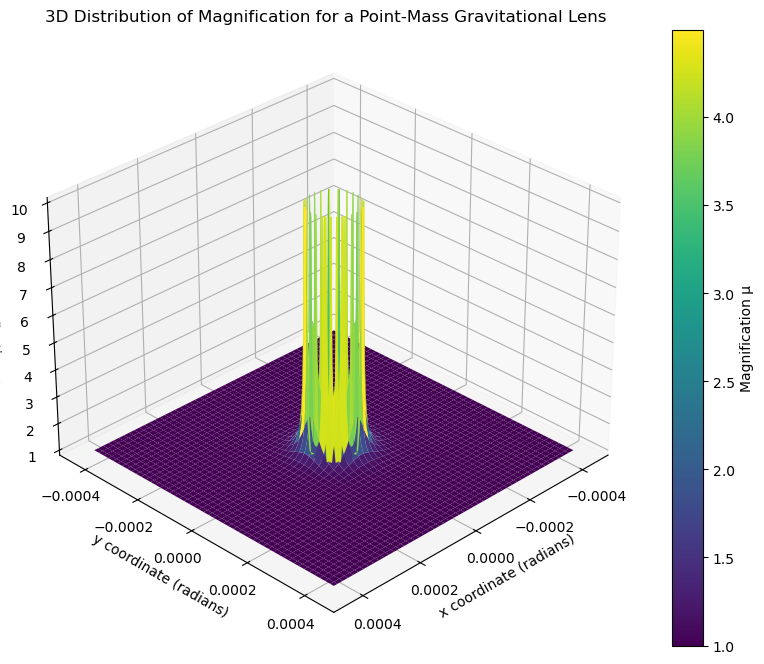

In [14]:
# Compute magnification map from lens model
theta_E_rad = theta_E_arcsec * np.pi / (180.0 * 3600.0)

magnification = get_magnification(xx, yy, theta_E_rad=theta_E_rad)


# Print basic diagnostics: shape and extreme values
print(magnification.shape, magnification.max(), magnification.min())


# Create 3D figure
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Build 2D coordinate grid for plotting
# Use x and y coordinates from the mesh
X, Y = np.meshgrid(xx[0], yy[:, 0])

# Plot the 3D surface of the magnification field
surf = ax.plot_surface(X, Y, magnification, cmap='viridis', edgecolor='none')

# Axis labels and title
ax.set_xlabel('x coordinate (radians)')
ax.set_ylabel('y coordinate (radians)')
ax.set_zlabel('Magnification μ')
ax.set_title('3D Distribution of Magnification for a Point-Mass Gravitational Lens')

# Add colorbar to indicate magnification scale
plt.colorbar(surf, ax=ax, label='Magnification μ')

# Adjust camera angle for better visualization
ax.view_init(elev=30, azim=45)

# Render the plot
plt.show()


## 5. Microlensing
---

### 5.1. Lensing Function
---

* It gathers in a single function the complete process to apply gravitational lensing to an image.
* The option **shift_x** is added to shift the point mass away from the origin along the X axis.


In [15]:
def lensing(src, fov, shift_x=0):
    # Number of pixels along one dimension (assumes square image)
    N = src.shape[1]

    # Convert field of view from degrees to radians
    fov_rad = fov * np.pi / 180.0

    # Angular pixel size
    dx = fov_rad / (N - 1)

    # Centered angular grid (image-plane coordinates)
    x = (torch.arange(N) - (N - 1) / 2.0) * dx
    y = (torch.arange(N) - (N - 1) / 2.0) * dx
    yy, xx = torch.meshgrid(y, x, indexing='ij')

    # -----------------------------
    # Deflection field (point-mass lens)
    # -----------------------------
    # Impact parameter at each grid point
    r = torch.sqrt(xx**2 + yy**2) + 1e-12

    # Deflection angles for a point-mass lens
    alpha_x = theta_E_rad**2 * xx / r**2
    alpha_y = theta_E_rad**2 * yy / r**2

    # Clip deflection to stay inside the grid (numerical safety)
    mask_x = alpha_x > xx.max()
    mask_y = alpha_y > yy.max()
    alpha_x[mask_x] = xx.max()
    alpha_y[mask_y] = yy.max()

    mask_x = alpha_x < xx.min()
    mask_y = alpha_y < yy.min()
    alpha_x[mask_x] = xx.min()
    alpha_y[mask_y] = yy.min()

    # -----------------------------
    # Lens equation: beta = theta - alpha
    # -----------------------------
    beta_x = xx - alpha_x
    beta_y = yy - alpha_y

    # Convert beta coordinates to pixel indices
    Px = beta_x / dx + (N - 1) / 2
    Py = beta_y / dx + (N - 1) / 2

    # -----------------------------
    # Ray-shooting using grid_sample
    # -----------------------------
    # Normalize pixel coordinates to [-1, 1] for grid_sample
    gx = 2.0 * (Px / (N - 1)) - 1 + shift_x
    gy = 2.0 * (Py / (N - 1)) - 1

    # Build sampling grid
    grid = torch.stack([gx, gy], dim=-1).unsqueeze(0)

    # Apply ray-shooting (bilinear interpolation, zero padding outside)
    lensed = F.grid_sample(torch.Tensor(src).unsqueeze(0),
                           grid,
                           mode='bilinear',
                           padding_mode='zeros',
                           align_corners=True)[0]

    return lensed, gx


### 5.2 Astronomical Image
---

* An image is generated with twice the size and twice the field of view (FOV) in order to avoid empty regions when shifting and centering the image.

  

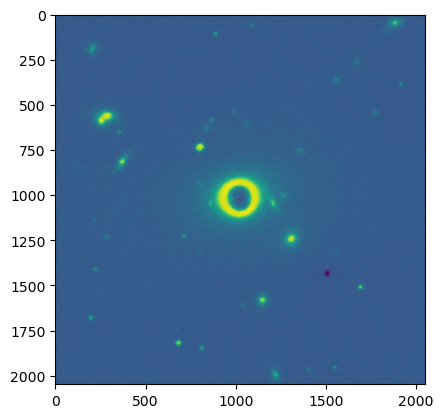

In [16]:
image_astro = get_Image_Astro(COORD, fov = 2*FOV, width = 2*PIX_X, height = 2*PIX_X, debug=False)
N_i = image_astro.shape[1]
src_i = torch.zeros((1, N_i, N_i))
src_i[0] =  torch.from_numpy(image_astro)
lensed_0, gx = lensing(src_i, 2* FOV, -0.0)
plt.imshow(lensed_0[0])
plt.show()


### 4.3 Image Generation (Lens Movement - MACHO Simulation)
---

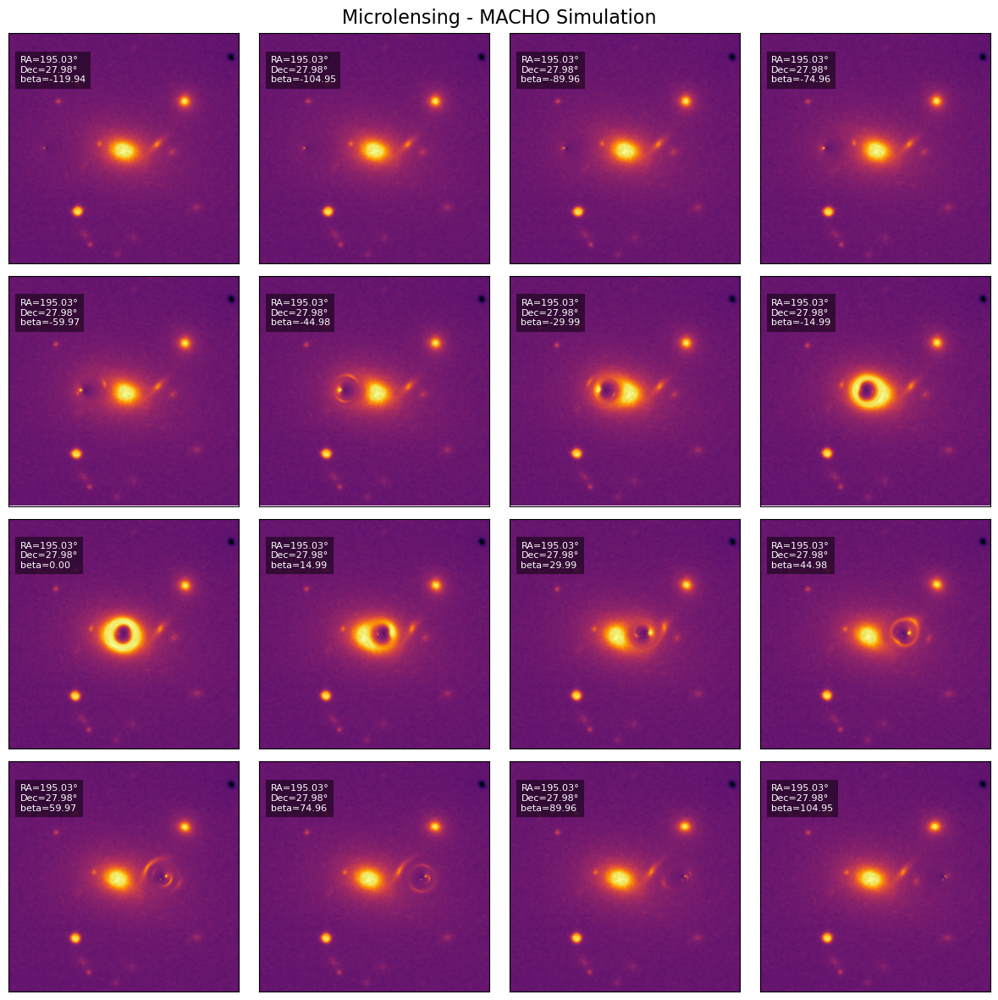

In [17]:
# -----------------------------
# Microlensing parameters
# -----------------------------
Delta = gx.max() / 3    # Maximum variation of the point-mass position in the source plane
N_lensed = 65           # Number of generated lensed images
delta_vals = np.linspace(-Delta, +Delta, 65)  # Array of lens displacements

# -----------------------------
# Microlensing simulation
# -----------------------------
fig, axes = plt.subplots(4, 4, figsize=(12, 12))  # 4x4 mosaic for visualization
lensed_list_lens = []                             # List to store cropped lensed images
img_n = 0                                         # Counter for subplot index
fov_arcsec = 2 * FOV * 3600                       # Field of view in arcseconds

for i, delta in enumerate(delta_vals):
    # Apply lensing for a given lens displacement
    lensed, gx_i = lensing(src_i, 3 * FOV, delta)

    H, W = lensed[0].shape

    crop_size = PIX_X     # Crop size (in pixels)
    delta_x = 10          # Pixel shift to the right (+) [currently not used]

    # Original image center
    cx, cy = W // 2, H // 2

    # Convert normalized displacement to pixel units
    PIX_delta = W / (gx_i.max() - gx_i.min())

    # Shift the crop center following the lens displacement along X
    cx_shifted = cx - delta * PIX_delta
    cy_shifted = cy       # No shift in Y (can be changed if desired)

    # Compute crop boundaries (clipped to the image limits)
    x_min = int(max(cx_shifted - crop_size // 2, 0))
    x_max = int(min(cx_shifted + crop_size // 2, W))
    y_min = int(max(cy_shifted - crop_size // 2, 0))
    y_max = int(min(cy_shifted + crop_size // 2, H))

    # Crop the lensed image
    lensed_crop = lensed[0, y_min:y_max, x_min:x_max]
    lensed_list_lens.append(lensed_crop)

    # Display one out of every 4 images in the 4x4 mosaic (up to 16 images)
    if i % 4 == 0 and img_n < 16:
        ax = axes[img_n // 4, img_n % 4]
        ax.imshow(
            lensed_crop,
            origin='lower',
            cmap='inferno',
            extent=[-fov_arcsec / 2, fov_arcsec / 2,
                    -fov_arcsec / 2, fov_arcsec / 2]
        )
        ax.set_xticks([])
        ax.set_yticks([])

        # Text overlay with RA, Dec, and beta (lens displacement scaled to arcseconds)
        textstr = f"RA={COORD['RA']:.2f}°\nDec={COORD['Dec']:.2f}°\nbeta={delta * fov_arcsec:.2f}"
        ax.text(
            0.05, 0.90, textstr, transform=ax.transAxes,
            fontsize=8, color="white",
            bbox=dict(facecolor='black', alpha=0.5, edgecolor='none'),
            ha='left', va='top'
        )
        img_n += 1

plt.suptitle("Microlensing - MACHO Simulation", fontsize=16)
plt.tight_layout()
plt.show()




### 5.4. Flux Variation

---

* The flux is integrated within a given radius.

  $$R_\star < \frac{2}{3}\theta_E$$

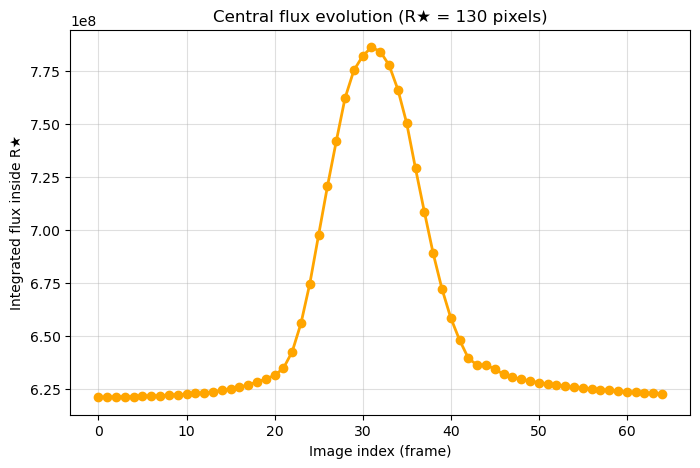

In [18]:
# Radius in pixels for the central region
R_star = 1.5 * theta_E_rad / dx  

# Compute the central flux for each lensed image
flux_list = []

for img in lensed_list_lens:
    H, W = img.shape

    # Build a coordinate grid for the image
    y, x = np.ogrid[:H, :W]

    # Image center (in pixels)
    cx, cy = W // 2, H // 2

    # Radial distance from the image center
    r = np.sqrt((x - cx)**2 + (y - cy)**2)

    # Mask selecting pixels inside the central circular region
    mask = torch.tensor(r <= R_star)

    # Integrate (sum) the flux inside the selected region
    flux = torch.sum(img[mask])
    flux_list.append(flux)

# Convert list of flux values to NumPy array
flux_list = np.array(flux_list)

# -----------------------------
# Central flux plot
# -----------------------------
plt.figure(figsize=(8, 5))
plt.plot(flux_list, 'o-', color='orange', lw=2)
plt.xlabel("Image index (frame)")
plt.ylabel("Integrated flux inside R★")
plt.title(f"Central flux evolution (R★ = {int(R_star)} pixels)")
plt.grid(True, alpha=0.4)
plt.show()


### 5.5. Microlensing (Source Moviment)
---

1. Image downloaded RA = 195.021, DEC = 27.977
2. Image downloaded RA = 195.022, DEC = 27.977
3. Image downloaded RA = 195.024, DEC = 27.977
4. Image downloaded RA = 195.026, DEC = 27.977
5. Image downloaded RA = 195.027, DEC = 27.977
6. Image downloaded RA = 195.029, DEC = 27.977
7. Image downloaded RA = 195.031, DEC = 27.977
8. Image downloaded RA = 195.032, DEC = 27.977
9. Image downloaded RA = 195.034, DEC = 27.977
10. Image downloaded RA = 195.036, DEC = 27.977
11. Image downloaded RA = 195.037, DEC = 27.977
12. Image downloaded RA = 195.039, DEC = 27.977
13. Image downloaded RA = 195.041, DEC = 27.977
14. Image downloaded RA = 195.042, DEC = 27.977
15. Image downloaded RA = 195.044, DEC = 27.977
16. Image downloaded RA = 195.046, DEC = 27.977


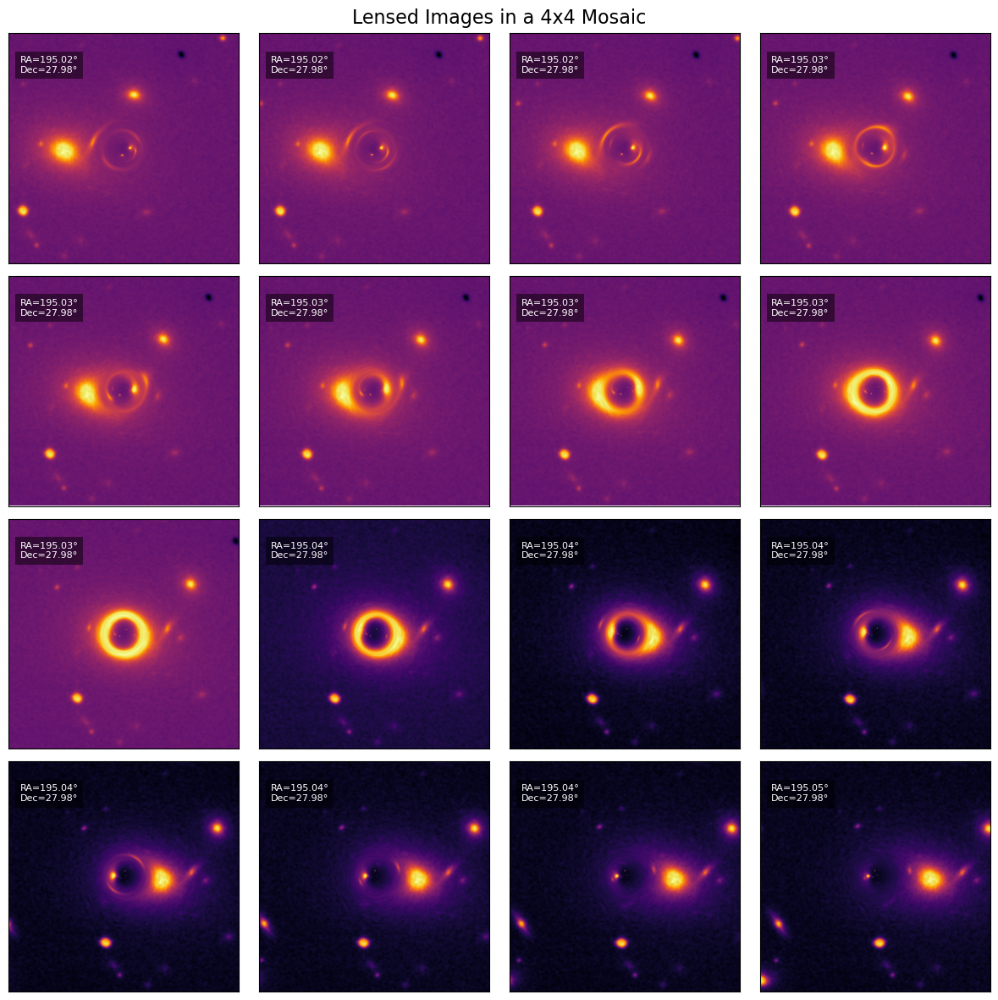

In [19]:
# Central sky coordinates (in degrees)
RA0, Dec0 = COORD['RA'], COORD['Dec']

# Define the RA scan range (a quarter of the field of view on each side)
Delta = FOV / 4

# Sample 16 RA positions to build a 4x4 mosaic
RA_vals = np.linspace(RA0 - Delta, RA0 + Delta, 16)

# Dec_vals = np.linspace(Dec0-Delta, Dec0+Delta, 4)  # (optional) scan in Dec as well

# -----------------------------
# Microlensing / Ray-shooting mosaic
# -----------------------------
fig, axes = plt.subplots(4, 4, figsize=(12, 12))
lensed_list = []

for i, ra in enumerate(RA_vals):
    ax = axes[i // 4, i % 4]  # Select subplot cell (row, col)

    # -----------------------------
    # Source image construction
    # -----------------------------
    # Allocate a single-channel source image (1, N, N)
    src_i = torch.zeros((1, N, N))

    # Update coordinate for this frame: RA varies, Dec fixed
    coord = {'RA': ra, 'Dec': Dec0}

    # Download / generate the astronomical image at (RA, Dec) and load into tensor
    src_i[0] = torch.from_numpy(get_Image_Astro(coord, debug=False))

    # Logging
    print(f'{i+1}. Image downloaded RA = {ra:.3f}, DEC = {Dec0:.3f}')

    # -----------------------------
    # Ray-shooting with grid_sample
    # -----------------------------
    # Px, Py are assumed to be already computed pixel-coordinate maps (same size as the image)
    # Convert Px, Py to normalized coordinates in [-1, 1] as required by grid_sample
    gx = torch.Tensor(2.0 * (Px / (N - 1)) - 1)
    gy = torch.Tensor(2.0 * (Py / (N - 1)) - 1)

    # Build the sampling grid of shape (1, H, W, 2)
    grid = torch.stack([gx, gy], dim=-1).unsqueeze(0)

    # Apply bilinear resampling; outside the image, fill with zeros
    lensed = F.grid_sample(
        src_i.unsqueeze(0), grid,
        mode='bilinear', padding_mode='zeros',
        align_corners=True
    )[0]

    # Store the lensed single-channel image (H, W)
    lensed_list.append(lensed[0])

    # -----------------------------
    # Display result
    # -----------------------------
    ax.imshow(
        lensed[0],
        origin='lower',
        cmap='inferno',
        extent=[-fov_arcsec / 2, fov_arcsec / 2,
                -fov_arcsec / 2, fov_arcsec / 2]
    )
    ax.set_xticks([])
    ax.set_yticks([])

    # Text overlay with RA and Dec inside each panel
    textstr = f"RA={ra:.2f}°\nDec={Dec0:.2f}°"
    ax.text(
        0.05, 0.90, textstr, transform=ax.transAxes,
        fontsize=8, color="white",
        bbox=dict(facecolor='black', alpha=0.5, edgecolor='none'),
        ha='left', va='top'
    )

plt.suptitle("Lensed Images in a 4x4 Mosaic", fontsize=16)
plt.tight_layout()
plt.show()


### 4.6. Microlensing - Animación

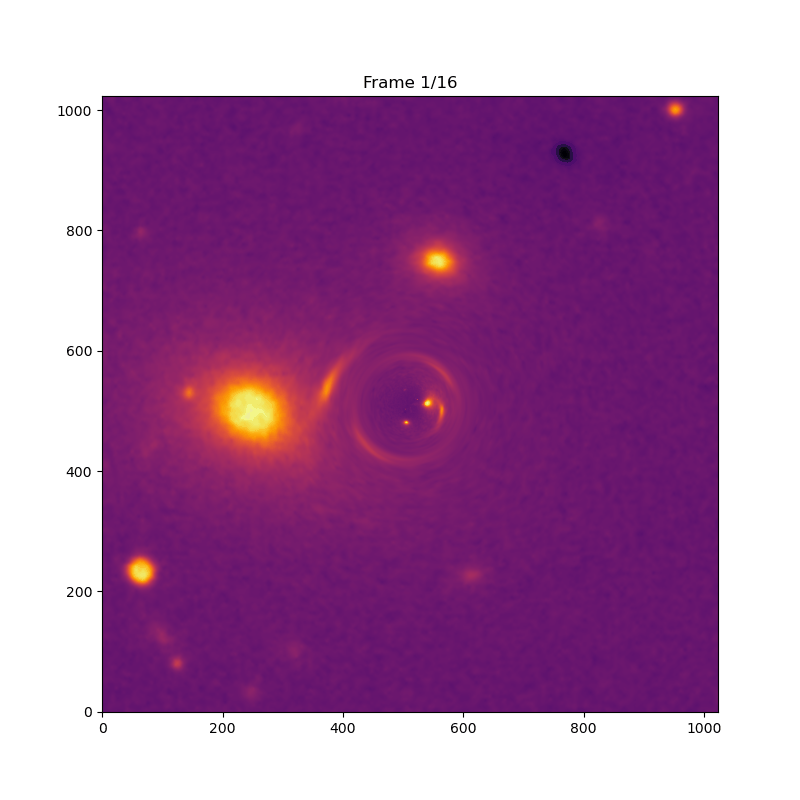

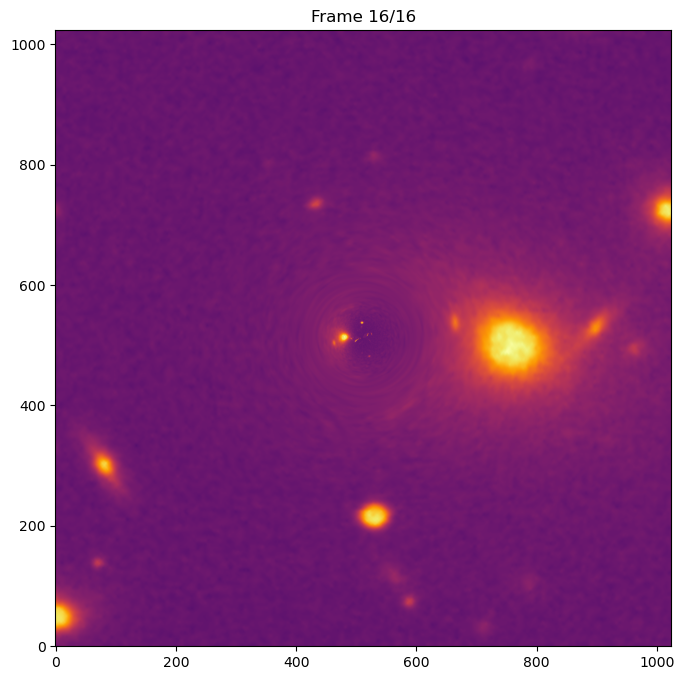

In [20]:
# -----------------------------
# Animation with Matplotlib
# -----------------------------
def update(frame):
    # Update the image data for the current frame
    im.set_array(lensed_list[frame])
    
    # Update the title to show the current frame index
    ax.set_title(f"Frame {frame+1}/{len(lensed_list)}")
    
    return [im]

# Create the figure and axis for the animation
fig, ax = plt.subplots(figsize=(8, 8))

# Display the first frame of the animation
im = ax.imshow(lensed_list[0], cmap="inferno", origin="lower")

# Set the initial title of the plot
ax.set_title("Gravitational Lensing Animation")

# Create the animation object
ani = animation.FuncAnimation(
    fig, update,
    frames=len(lensed_list),   # Total number of frames
    interval=1000,              # Time between frames in milliseconds
    blit=True                  # Optimize drawing by only updating changed elements
)

# Save the animation as a GIF file
ani.save("lensed_animation.gif", writer="pillow", fps=10)

# Display the GIF in the notebook
Image(filename="lensed_animation.gif")


## 6. Mass Distribution Profile
---

### 6.1. NFW Dark Matter Halo
---

The Navarro–Frenk–White (NFW) profile, derived from cosmological N-body simulations, describes dark matter (DM) halos as spherical structures whose density decreases with radius. This profile is considered “universal” for cold dark matter (CDM) halos in ΛCDM models, featuring a central cusp and a smooth decline at large radii.
The 3D density profile of the NFW model is:

$$
\rho(r) = \frac{\rho_s}{(r/r_s),(1 + r/r_s)^2}
$$

* **Scale Radius ($ r_s $):**
  Represents the radius at which the profile transitions from a steep inner slope ($\rho \propto r^{-1}$, central cusp) to a shallower outer slope ($\rho \propto r^{-3}$). Typically, $ r_s \approx 10$–$100 ,\text{kpc}$ for galactic halos and up to megaparsec scales for galaxy clusters.

* **Characteristic Density ($ \rho_s $):**
  The density at $ r = r_s $, usually in the range
  $ \rho_s \approx 10^6$–$10^8 , M_\odot / \text{kpc}^3 $ for galactic halos.

* **Concentration ($ c $):**
  Defined as $ c = r_{vir} / r_s $, where $ r_{vir} $ is the virial radius (e.g., $ r_{200} $, the radius within which the mean density is 200 times the critical density). Typical values are $ c \approx 5$–$15 $ for galaxy-sized halos and smaller for massive clusters.
  In CDM models, $ c $ depends on halo mass and redshift, approximately following
  $ c \propto M^{-0.1} $, reflecting hierarchical formation: smaller halos form earlier and are therefore more concentrated.

* **Virial Mass ($ M_{vir} $ or $ M_{200} $):**
  The total mass enclosed within $ r_{vir} $, commonly defined as
  $$
  M_{200} = \frac{4\pi}{3} r_{200}^3 \cdot 200, \rho_{cr},
  $$
  where the critical density is
  $$
  \rho_{cr} = \frac{3H^2}{8\pi G}.
  $$


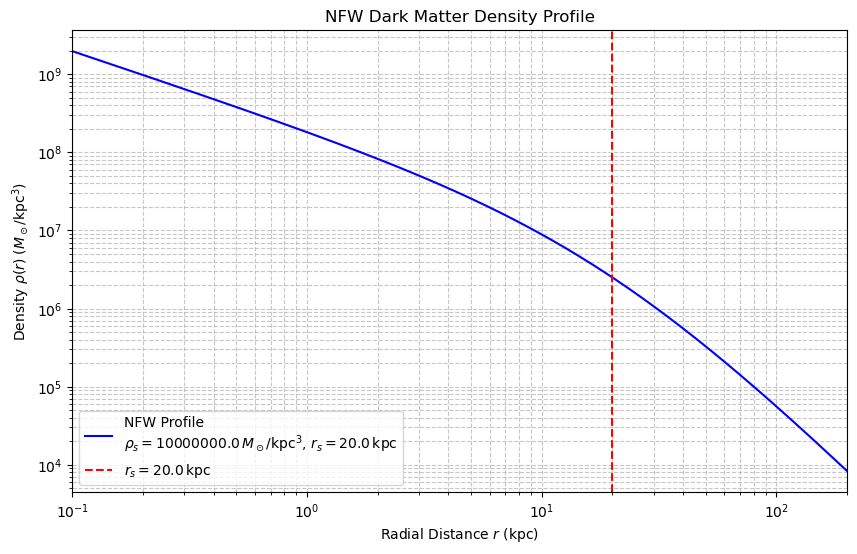

In [21]:
# Define NFW profile parameters
rho_s = 1e7   # Characteristic density in M☉/kpc³ (typical example for a galactic halo)
r_s = 20.0    # Scale radius in kpc (adjustable depending on the halo)
r_max = 200.0 # Upper radial limit for the plot in kpc

# Generate a range of radial distances
# Logarithmic spacing from 0.1 kpc up to r_max
r = np.logspace(-1, np.log10(r_max), 500)

# Compute the density rho(r) according to the NFW profile
# rho(r) = rho_s / [(r/r_s) (1 + r/r_s)^2]
rho = rho_s / ((r / r_s) * (1 + r / r_s)**2)

# Create the plot
plt.figure(figsize=(10, 6))

# Log-log plot of the NFW density profile
plt.loglog(
    r, rho,
    label=f'NFW Profile\n$\\rho_s = {rho_s} \\, M_\\odot/\\text{{kpc}}^3$, $r_s = {r_s} \\, \\text{{kpc}}$',
    color='blue'
)

# Axis labels
plt.xlabel('Radial Distance $r$ (kpc)')
plt.ylabel('Density $\\rho(r)$ ($M_\\odot/\\text{kpc}^3$)')

# Plot title
plt.title('NFW Dark Matter Density Profile')

# Grid for better readability on log scales
plt.grid(True, which="both", ls="--", alpha=0.7)

# Show legend
plt.legend()

# Set x-axis limits
plt.xlim(r[0], r[-1])

# Add a vertical line marking the scale radius r_s
plt.axvline(x=r_s, color='red', linestyle='--', label=f'$r_s = {r_s} \\, \\text{{kpc}}$')
plt.legend()

# Display the figure
plt.show()


### 6.2. Extended Lens
---
For extended lenses (e.g., galaxies or dark matter halos), the lensing deflection is obtained by integrating the projected potential:

$$
\vec{\alpha}(\vec{\xi}) = \frac{4G}{c^2} \int \frac{\Sigma(\vec{\xi}') , (\vec{\xi} - \vec{\xi}')}{|\vec{\xi} - \vec{\xi}'|^2}, d^2\xi'
$$

where $ \Sigma $ is the projected surface mass density, and $ \vec{\xi} $ is the position vector in the lens plane.


# License and Terms of Use
---
This code is distributed under the terms of the GNU General Public License (GPL).
You are free to use, modify, and redistribute it, provided that any derivative work is released under the same license and that proper credit is given to the original author.
The code is provided “as is”, without any warranty of any kind, express or implied.